In [ ]:
"""
PROGETTO DI IMAGE CAPTIONING

Questo codice implementa un modello di deep learning per generare descrizioni per sketch.
Il modello utilizza una combinazione di Reti Neurali Convoluzionali (CNN) per l'estrazione delle feature delle immagini
e una LTSM per la generazione del testo.

Il codice esegue i seguenti passaggi principali:
1. Estrazione delle feature delle Immagini: Estrae le feature dalle immagini dei disegni utilizzando un modello CNN pretrained chiamata Xception.
2. Preprocessing del Testo: Pulisce il testo delle descrizioni e ne fa una tokenizzazione
3. Training del Modello: Definisce e allena un modello utilizzando le feature estratte dalle immagini e i dati di testo preprocessati.
4. Valutazione del Modello: Valuta il modello addestrato utilizzando diverse Score per valutare la qualità delle descrizioni.
5. Generazione di Caption: Genera descrizioni per nuove immagini di disegni utilizzando il modello addestrato.

Autore: Tommaso Senatori
"""

###Import Libraries and Dataset

In [ ]:
import string                    # per operazioni comuni sulle stringhe, ad esempio per rimuovere la punteggiatura dalle didascalie.
import numpy as np               # supporto per l'array multidimensionale e altre operazioni matematiche, fondamentali per il trattamento dei dati.
from PIL import Image            # per aprire, manipolare e salvare immagini, che sono dati di input per il modello di captioning.
import os                        # per interagire con il sistema operativo, ad esempio per gestire i file.
import pickle #(dump e load)     # per la serializzazione e deserializzazione di oggetti Python, utile per salvare e caricare i modelli del progetto.
import matplotlib.pyplot as plt  # per grafico loss over epochs
from tqdm.notebook import tqdm   # for seeing the progress of loops

from keras.applications.xception import Xception, preprocess_input      # Fornisce un'implementazione pre-addestrata di Xception, un modello CNN spesso utilizzato per l'estrazione delle caratteristiche delle immagini.
from keras.preprocessing.image import load_img, img_to_array            # Fornisce funzioni per caricare un'immagine da file e convertirla in un array NumPy.
from keras.preprocessing.text import Tokenizer                          # per convertire le didascalie delle immagini in sequenze di token per l'addestramento del modello.
from keras.preprocessing.sequence import pad_sequences                  # per aggiungere padding alle sequenze di token delle didascalie delle immagini, assicurando che abbiano tutte la stessa lunghezza.
from keras.utils import to_categorical, plot_model                      # per fare ohe e per stampare l'architettura dei modelli
from keras.models import Model, load_model                              # Fornisce supporto per la definizione e il caricamento dei modelli di deep learning.
from keras.layers import Input, Dense, LSTM, Embedding, Dropout, add    # Fornisce le classi necessarie per definire gli strati del modello di captioning, come strati di input, LSTM, Embedding, Dropout, ecc.
from keras.optimizers import Adam                                       # per impostare il learning rate alpha

In [ ]:
BASE_DIR = "/content/drive/MyDrive/Tirocinio/Datasets/flickr8k"
WORKING_DIR = "/content/drive/MyDrive/Tirocinio/f8k_sit"

dataset_text = os.path.join(BASE_DIR, 'captions.txt')
dataset_images = os.path.join(BASE_DIR, 'Images')

###Feature Extraction

83683744/83683744 [==============================] - 2s 0us/step
Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, None, None, 32)       128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activat

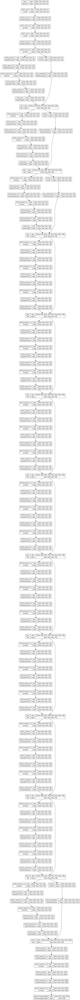

In [ ]:
model = Xception(include_top=False, pooling='avg')
# summary e plot
print(model.summary())
plot_model(model, show_shapes=True)

#  "None, None, None" shape = layer is capable of processing inputs of variable spatial dimensions.

1/1 [==============================] - 2s 2s/step
Shape of extracted features: (1, 2048)


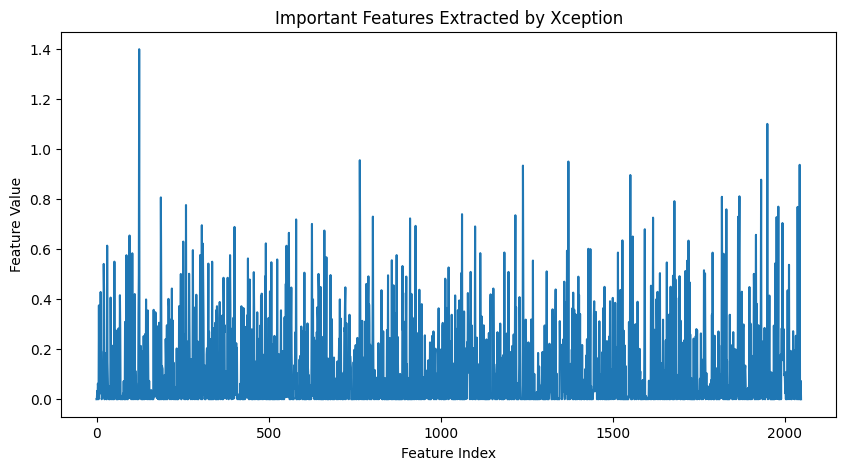

In [ ]:
img_path = dataset_images + "/69189650_6687da7280.jpg" # dog image
image = Image.open(img_path).convert('RGB')
image = image.resize((299, 299))

image = np.expand_dims(image, axis=0)
image = preprocess_input(image)

features = model.predict(image)

print("Shape of extracted features:", features.shape)

# Plotto le features più importanti
plt.figure(figsize=(10, 5))
plt.plot(features.ravel())
plt.title('Important Features Extracted by Xception')
plt.xlabel('Feature Index')
plt.ylabel('Feature Value')
plt.show()

In [ ]:
# feature extraction dalle immagini: creo un dictionary (key,value) = (image_id,features)
def extract_features(directory):
        features = {}
        for img_name in tqdm(os.listdir(directory)): # for each image in 'Images' directory
            # load image from file
            img_path = directory + "/" + img_name
            image = Image.open(img_path)
            # reshape data for model
            image = image.resize((299,299))
            image = np.expand_dims(image, axis=0)
            # preprocess image for Xception
            image = preprocess_input(image) # normalization e altro
            # estraggo le features
            feature = model.predict(image, verbose=0) # feature = output of the Xception
            features[img_name] = feature
        return features

# eseguo
features = extract_features(dataset_images)

In [ ]:
# save features in pickle
pickle.dump(features, open(os.path.join(WORKING_DIR, 'features_sit.pkl'), 'wb'))

In [ ]:
# load features from pickle
features = pickle.load(open(os.path.join(WORKING_DIR, 'features_sit.pkl'),"rb"))

In [ ]:
# Rimuovo estensione .jpg dalle key in features
features = {key.split('.')[0]: value for key, value in features.items()}

###Load captions data

In [ ]:
# creo un dictionary (key,value) = (image_id,captions)
def all_img_captions(filename):
    with open(filename, 'r') as file:
        captions = file.readlines()

    mapping = {}
    for line in captions[1:]:  # skip the header line
        parts = line.strip().split(',')
        img = parts[0]
        caption = ','.join(parts[1:])  # join all but the first part
        img_name = img.split('.')[0]  # tolgo estensione .jpg
        if img_name not in mapping:
            mapping[img_name] = [caption]
        else:
            mapping[img_name].append(caption)

    return mapping

In [ ]:
# eseguo
mapping = all_img_captions(dataset_text)
print("Number of unique images =" ,len(mapping))

Number of unique images = 8091


### Preprocess text data



In [ ]:
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')   # modelli per la tokenization
nltk.download('wordnet') # database inglese che dà correlazioni semantiche tra parole

def clean(mapping):
    lemmatizer = WordNetLemmatizer()  # Inizializzo il lemmatizer
    for key, captions in mapping.items(): # per ogni image_id e le sue 5 caption
        for i in range(len(captions)): # per ogni caption nella lista di captions
            caption = captions[i] # prendo una caption per volta

            caption = caption.lower() # lowercase
            caption = re.sub(r'[^\w\s]', '', caption) # rimuovo caratteri non alfanumerici (\w) o spazi (\s)
            caption = re.sub(r'\s+', ' ', caption) # rimpiazzo spazi consecutivi con uno solo

            # tokenizzo la caption in parole (token)
            tokens = word_tokenize(caption)
            # Lemmatizzazione dei token: ogni token è rimpiazzato con il suo lemma (forma base)
            lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
            # Rimetto il caption pulito in una stringa
            cleaned_caption = ' '.join(lemmatized_tokens)
            # Aggiungo i tag di inizio e fine
            cleaned_caption = 'startseq ' + cleaned_caption + ' endseq'
            # Sostituisco la caption originale con quella pulita
            captions[i] = cleaned_caption
    return mapping

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
# before preprocess of text
mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
# cleaning text
mapping = clean(mapping)
# after preprocess of text
mapping['1000268201_693b08cb0e']

['startseq a child in a pink dress is climbing up a set of stair in an entry way endseq',
 'startseq a girl going into a wooden building endseq',
 'startseq a little girl climbing into a wooden playhouse endseq',
 'startseq a little girl climbing the stair to her playhouse endseq',
 'startseq a little girl in a pink dress going into a wooden cabin endseq']

In [ ]:
# from mapping (dict) to all_captions (list)
def extract_all_captions(mapping):
    all_captions = []
    for key in mapping:
        for caption in mapping[key]:
            all_captions.append(caption)
    return all_captions

# eseguo
all_captions = extract_all_captions(mapping)

In [ ]:
len(all_captions) # 5 captions per image

40455

In [ ]:
all_captions[:10]

['startseq a child in a pink dress is climbing up a set of stair in an entry way endseq',
 'startseq a girl going into a wooden building endseq',
 'startseq a little girl climbing into a wooden playhouse endseq',
 'startseq a little girl climbing the stair to her playhouse endseq',
 'startseq a little girl in a pink dress going into a wooden cabin endseq',
 'startseq a black dog and a spotted dog are fighting endseq',
 'startseq a black dog and a tricolored dog playing with each other on the road endseq',
 'startseq a black dog and a white dog with brown spot are staring at each other in the street endseq',
 'startseq two dog of different breed looking at each other on the road endseq',
 'startseq two dog on pavement moving toward each other endseq']

In [ ]:
# tokenize text (create vocabulary, assigning an index per each word)
def tokenization(all_captions):
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(all_captions)
    return tokenizer

# eseguo
tokenizer = tokenization(all_captions)
vocab_size = len(tokenizer.word_index) + 1 # tot number of unique words
print(vocab_size)

7620


In [ ]:
tokenizer.word_index # the lower the integer assigned to a word, the more the frequency in the captions

{'a': 1,
 'startseq': 2,
 'endseq': 3,
 'in': 4,
 'the': 5,
 'on': 6,
 'dog': 7,
 'is': 8,
 'and': 9,
 'with': 10,
 'man': 11,
 'of': 12,
 'two': 13,
 'boy': 14,
 'girl': 15,
 'woman': 16,
 'white': 17,
 'black': 18,
 'are': 19,
 'to': 20,
 'wearing': 21,
 'at': 22,
 'people': 23,
 'water': 24,
 'child': 25,
 'red': 26,
 'young': 27,
 'brown': 28,
 'an': 29,
 'his': 30,
 'blue': 31,
 'running': 32,
 'through': 33,
 'playing': 34,
 'while': 35,
 'shirt': 36,
 'ball': 37,
 'down': 38,
 'standing': 39,
 'little': 40,
 'grass': 41,
 'person': 42,
 'snow': 43,
 'jumping': 44,
 'over': 45,
 'stand': 46,
 'front': 47,
 'three': 48,
 'jump': 49,
 'sitting': 50,
 'it': 51,
 'holding': 52,
 'run': 53,
 'field': 54,
 'small': 55,
 'play': 56,
 'up': 57,
 'by': 58,
 'large': 59,
 'green': 60,
 'group': 61,
 'one': 62,
 'yellow': 63,
 'her': 64,
 'walking': 65,
 'men': 66,
 'into': 67,
 'air': 68,
 'beach': 69,
 'mouth': 70,
 'near': 71,
 'player': 72,
 'rock': 73,
 'street': 74,
 'another': 75,
 '

In [ ]:
# get maximum length of the caption available (to do padding)
max_length = max(len(caption.split()) for caption in all_captions)
max_length

38

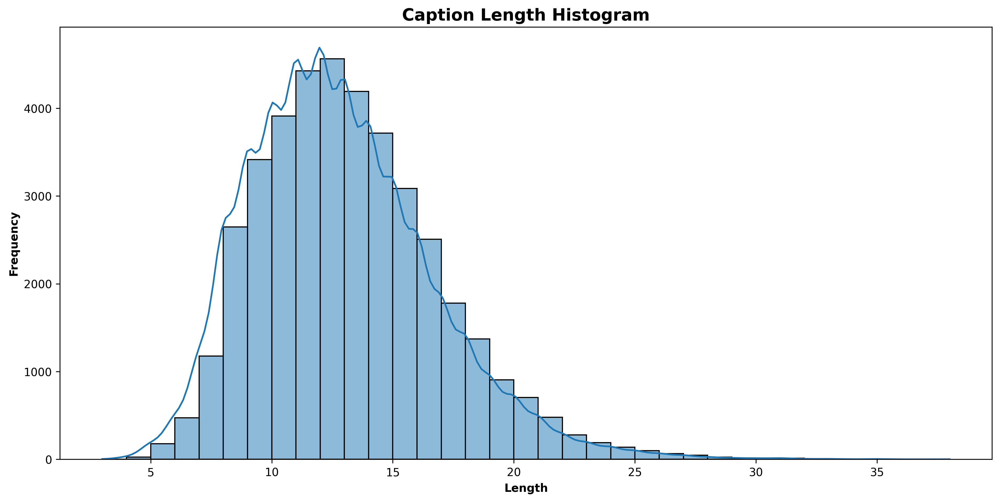

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_caption_lengths(captions):
    # dimensione e risoluzione
    plt.figure(figsize=(15, 7), dpi=300) # dotsperinch (resolution)

    # lista con length per ogni caption
    caption_lengths = [len(caption.split()) for caption in captions]

    # plot istogramma
    sns.histplot(x=caption_lengths, kde=True, binwidth=1)

    # Set plot titles and labels
    plt.title('Caption Length Histogram', fontsize=15, fontweight='bold')
    plt.xlabel('Length', fontweight='bold')
    plt.ylabel('Frequency', fontweight='bold')

    # Show the plot
    plt.show()

# eseguo
plot_caption_lengths(all_captions)

###Train Test Split

In [ ]:
image_ids = list(mapping.keys())

split = int(len(image_ids) * 0.80)
train = image_ids[:split]
remaining = image_ids[split:]

# Divido le immagini restanti a metà tra validation set e test set
split2 = len(remaining) // 2
val = remaining[:split2]
test = remaining[split2:]

# Verify the sizes of the splits
print("Train set size:", len(train))
print("Validation set size:", len(val))
print("Test set size:", len(test))

Train set size: 6472
Validation set size: 809
Test set size: 810


In [ ]:
# creo data generator per dividire i dati in batch (evita il session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    X1, X2, y = list(), list(), list() #((3933, 2048), (3933, 38), (3933, 7620))
    n = 0
    while 1:
        for key in data_keys: # for each image_id
            n+=1
            captions = mapping[key]
            # processo ogni caption
            for caption in captions: # per ogni caption con lo stesso image_id
                # encode the sequence: we get an index for each word
                seq = tokenizer.texts_to_sequences([caption])[0]
                # splitto la sequenza in coppie X,y
                for i in range(1, len(seq)):
                    # split into input and output paths
                    in_seq, out_seq = seq[:i], seq[i]
                    # padding of input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # one hot encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]

                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size: # reset per evitare un crash
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

In [ ]:
# You can check the shape of the input and output for your model

gen = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size=64)

# Get a batch of data from the generator
X, y = next(gen)

# Print the shape of X1, X2, and y
X1, X2 = X
print("Shape of X1:", X1.shape)
print("Shape of X2:", X2.shape)
print("Shape of y:", y.shape)

Shape of X1: (3933, 2048)
Shape of X2: (3933, 38)
Shape of y: (3933, 7620)


###Model Creation

In [ ]:
# define the captioning model
def define_model(vocab_size, max_length, alpha):

    # features from the CNN model squeezed from 2048 to 256 nodes
    inputs1 = Input(shape=(2048,)) # input: Xception output (2048)
    fe1 = Dropout(0.5)(inputs1)
    fe2 = Dense(256, activation='relu')(fe1)

    # LSTM sequence model
    inputs2 = Input(shape=(max_length,))
    se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
    se2 = Dropout(0.5)(se1)
    se3 = LSTM(256)(se2)

    # Merging both models
    decoder1 = add([fe2, se3])
    decoder2 = Dense(256, activation='relu')(decoder1)
    outputs = Dense(vocab_size, activation='softmax')(decoder2)

    # tie it together [image, seq] [word]
    model = Model(inputs=[inputs1, inputs2], outputs=outputs)
    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=alpha))

    return model

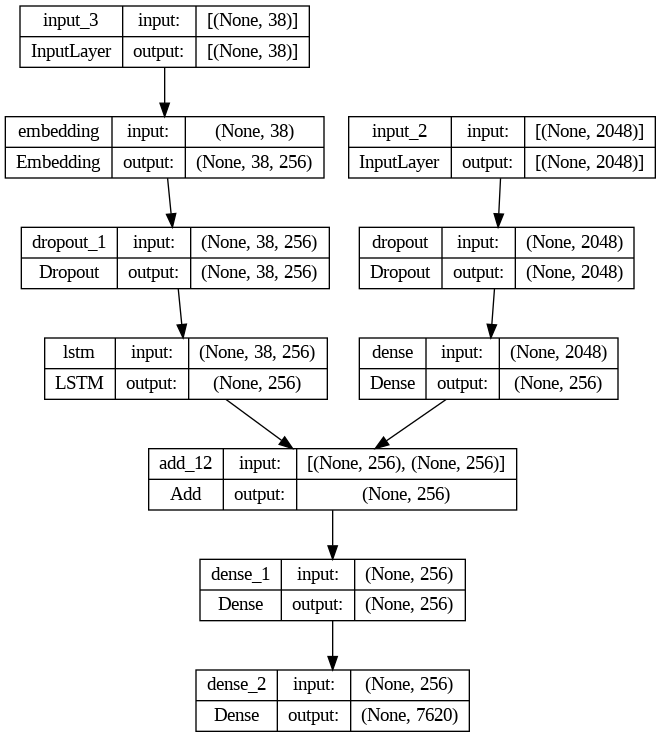

In [ ]:
model = define_model(vocab_size, max_length, alpha=0.001)
plot_model(model, show_shapes=True)

###Train the model

In [ ]:
losses = []
val_losses = []
epochs = 10
batch_size = 64
steps = len(train) // batch_size
val_steps = len(val) // batch_size

for i in range(epochs):
    # Create data generator for training set
    train_generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # Create data generator for validation set
    val_generator = data_generator(val, mapping, features, tokenizer, max_length, vocab_size, batch_size)

    # Fit the model for 1 epoch
    history = model.fit(train_generator, epochs=1, steps_per_epoch=steps, validation_data=val_generator,
                        validation_steps=val_steps, verbose=1)

    # Store the losses for this epoch
    losses.append(history.history['loss'][0])
    val_losses.append(history.history['val_loss'][0])

    # Save the model at the 7th epoch
    if i == 6: model.save(WORKING_DIR + '/MODEL_7SIT.h5')

101/101 [==============================] - 47s 469ms/step - loss: 2.8390 - val_loss: 3.2736


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


101/101 [==============================] - 57s 561ms/step - loss: 2.5912 - val_loss: 3.2559


In [ ]:
# Load the pre-trained model
model = load_model(WORKING_DIR + '/MODEL_10SIT.h5')

# Load the pre-saved losses
with open(os.path.join(WORKING_DIR, 'losses_10sit.pkl'), 'rb') as f:
    losses = pickle.load(f)
with open(os.path.join(WORKING_DIR, 'vlosses_10sit.pkl'), 'rb') as f:
    val_losses = pickle.load(f)

epochs = 5
batch_size = 64
steps = len(train) // batch_size
val_steps = len(val) // batch_size

for i in range(epochs):
    # Create data generator for training set
    train_generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # Create data generator for validation set
    val_generator = data_generator(val, mapping, features, tokenizer, max_length, vocab_size, batch_size)

    # Fit the model for 1 epoch with early stopping
    history = model.fit(train_generator, epochs=1, steps_per_epoch=steps, validation_data=val_generator,
                        validation_steps=val_steps, verbose=1)

    # Store the losses for this epoch
    losses.append(history.history['loss'][0])
    val_losses.append(history.history['val_loss'][0])

    # Save the model at the 12th epoch
    if i == 1: model.save(WORKING_DIR + '/MODEL_12SIT.h5')

101/101 [==============================] - 54s 535ms/step - loss: 2.4778 - val_loss: 3.2552


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


101/101 [==============================] - 53s 523ms/step - loss: 2.3285 - val_loss: 3.2872


In [ ]:
# Save losses
with open(os.path.join(WORKING_DIR, 'losses_15sit.pkl'), 'wb') as f:
    pickle.dump(losses, f)
with open(os.path.join(WORKING_DIR, 'vlosses_15sit.pkl'), 'wb') as f:
    pickle.dump(val_losses, f)

In [ ]:
# Load losses
with open(os.path.join(WORKING_DIR, 'losses_15sit.pkl'), 'rb') as f:
    losses = pickle.load(f)
with open(os.path.join(WORKING_DIR, 'vlosses_15sit.pkl'), 'rb') as f:
    val_losses = pickle.load(f)

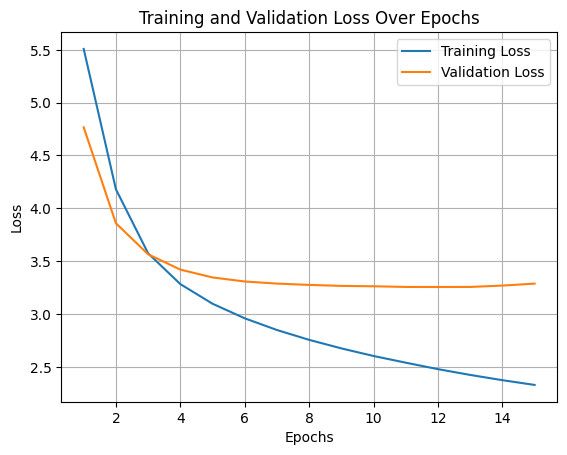

In [ ]:
def plot_loss(losses, val_losses):
    epochs = len(losses)
    plt.plot(range(1, epochs + 1), losses, label='Training Loss')
    plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss Over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_loss(losses, val_losses)


In [ ]:
# save the model
model.save(WORKING_DIR + '/MODEL_10SIT.h5')

In [ ]:
# load the model
model = load_model(WORKING_DIR + '/MODEL_12SIT.h5')

###Generate captions for the image

In [ ]:
def idx_to_word(integer, tokenizer): # rida la parola a cui corrisponde l'integer
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
# generazione della caption per un'immagine (greedy)
def predict_caption_greedy(model, image_features, tokenizer, max_length):
    # aggiungo lo start tag
    in_text = 'startseq'
    # per ogni parola (caption non più lunga di max_length)
    for i in range(max_length):
        # encode input sequence (convert words to integers)
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict the next word
        yhat = model.predict([image_features, sequence], verbose=0)
        # get index with highest probability
        yhat = np.argmax(yhat)
        # convert predicted index to a word
        word = idx_to_word(yhat, tokenizer)
        # stop if word is not found
        if word is None: break
        # else : append word as input for generating next word
        in_text += " " + word
        # stop se raggiungiamo l'end tag
        if word == 'endseq': break
    return in_text

In [ ]:
# generazione della caption per un'immagine (beam search)
def predict_caption_beam_search(model, image_features, tokenizer, max_length, beam_width):
    # Inizializzazione
    start_seq = 'startseq'
    sequences = [(start_seq, 0.0)] # (word, LogLikelihood)

    # Beam search loop
    while len(sequences[0][0].split()) < max_length:
        all_candidates = []
        # iteriamo per ogni elemento in ogni sequenza
        for seq, score in sequences:
            # Encode input sequence
            encoded_seq = tokenizer.texts_to_sequences([seq])[0]
            # pad the sequence
            encoded_seq = pad_sequences([encoded_seq], maxlen=max_length, padding='post')
            # get probabilities of every word to be the next
            yhat = model.predict([image_features, encoded_seq], verbose=0)
            # Get top "beam_width" candidates
            top_candidates = np.argsort(yhat[0])[-beam_width:] # [-x:] : gli ultimi 3 (i più alti)
            # per ogni candidate, creo una nuova sequenza
            for word_idx in top_candidates:
                candidate_seq = seq + " " + idx_to_word(word_idx, tokenizer)   # aggiungo la parola alla sequenza
                candidate_score = score + np.log(yhat[0][word_idx])
                all_candidates.append((candidate_seq, candidate_score)) # calcolo la score della parola
        # ordino tutti i candidates in base al loro 2o elemento (score)
        ordered = sorted(all_candidates, key=lambda tup: tup[1], reverse=True)
        # seleziono i primi "beam_width" candidates
        sequences = ordered[:beam_width]
        # stop se raggiungiamo l'end tag
        if sequences[0][0].split()[-1] == 'endseq': break

    # return best sequence
    return sequences[0][0]

beam_width = 5

###Calculate BLEU Score

In [ ]:
from nltk.translate.bleu_score import corpus_bleu

# Calcola le score BLEU-1 e BLEU-2 per l'intero test set, usando il metodo di predizione greedy
def calculate_bleu_score_greedy(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = list(), list()

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption_greedy(model, features[key], tokenizer, max_length)
        # split into words
        actual_captions = [caption.split() for caption in captions]
        y_pred = y_pred.split()
        # append to the lists
        actual.append(actual_captions)
        predicted.append(y_pred)

    # calculate BLEU score (score for text data) (excellent if >0.4)
    bleu1 = corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0))
    bleu2 = corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0))

    return bleu1, bleu2


# Calcola le score BLEU-1 e BLEU-2 per l'intero test set, usando il metodo di predizione beam search
def calculate_bleu_score_beam_search(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = list(), list()

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption_beam_search(model, features[key], tokenizer, max_length, beam_width)
        # split into words
        actual_captions = [caption.split() for caption in captions]
        y_pred = y_pred.split()
        # append to the lists
        actual.append(actual_captions)
        predicted.append(y_pred)

    # calculate BLEU score (score for text data) (excellent if >0.4)
    bleu1 = corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0))
    bleu2 = corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0))

    return bleu1, bleu2


# eseguo

bleu1_greedy, bleu2_greedy = calculate_bleu_score_greedy(model, test, mapping, features, tokenizer, max_length)
print("BLEU-1 (greedy): {:.6f}".format(bleu1_greedy))
print("BLEU-2 (greedy): {:.6f}".format(bleu2_greedy))

bleu1_beam, bleu2_beam = calculate_bleu_score_beam_search(model, test, mapping, features, tokenizer, max_length)
print("BLEU-1 (beam search): {:.6f}".format(bleu1_beam))
print("BLEU-2 (beam search): {:.6f}".format(bleu2_beam))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1 (greedy): 0.593739
BLEU-2 (greedy): 0.415030


  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1 (beam search): 0.623245
BLEU-2 (beam search): 0.443671


In [ ]:
# SEGNATI LE SCORE
# epochs = 8 --> 3.7562, 0.567483, 0.353446
# epochs = 10 --> 3.7716, 0.556733, 0.346210

# epochs = 12 --> 3.2552, 0.593739, 0.415030 (LEMMATIZATION)
# epochs = 12 --> 3.2552, 0.623245, 0.443671 (beam search)

###Calculate CIDEr Score

In [ ]:
from pycocoevalcap.cider.cider import Cider

# Calcola la score CIDEr per l'intero test set, usando il metodo di predizione greedy
def calculate_cider_score_greedy(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = {}, {} # devono per forza essere mappe, perchè sono i parametri di compute_score

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption_greedy(model, features[key], tokenizer, max_length)
        # append to the dictionaries
        actual[key] = [' '.join(caption.split()) for caption in captions]
        predicted[key] = [' '.join(y_pred.split())]

    # calculate CIDEr score
    cider_scorer = Cider()
    cider_score, _ = cider_scorer.compute_score(actual, predicted)

    return cider_score


# Calcola la score CIDEr per l'intero test set, usando il metodo di predizione beam search
def calculate_cider_score_beam_search(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = {}, {} # devono per forza essere mappe, perchè sono i parametri di compute_score

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption_beam_search(model, features[key], tokenizer, max_length, beam_width)
        # append to the dictionaries
        actual[key] = [' '.join(caption.split()) for caption in captions]
        predicted[key] = [' '.join(y_pred.split())]

    # calculate CIDEr score
    cider_scorer = Cider()
    cider_score, _ = cider_scorer.compute_score(actual, predicted)

    return cider_score


# eseguo

cider_score_greedy = calculate_cider_score_greedy(model, test, mapping, features, tokenizer, max_length)
print("CIDEr (greedy): {:.6f}".format(cider_score_greedy))

cider_score_beam_search = calculate_cider_score_beam_search(model, test, mapping, features, tokenizer, max_length)
print("CIDEr (beam search): {:.6f}".format(cider_score_beam_search))

  0%|          | 0/810 [00:00<?, ?it/s]

CIDEr (greedy): 0.404985


  0%|          | 0/810 [00:00<?, ?it/s]

CIDEr (beam search): 0.481412


###Calculate ROUGE-L Score

In [ ]:
from rouge import Rouge

# Calcola le score BLEU-1 e BLEU-2 per l'intero test set, usando il metodo di predizione greedy
def calculate_rougel_score_greedy(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = list(), list()

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption_greedy(model, features[key], tokenizer, max_length)
        # append to the lists
        actual.extend(captions)
        predicted.extend([y_pred] * 5) # ho 1 caption generata per ogni 5 caption effettive

    # calculate ROUGE-L score
    rouge = Rouge()
    scores = rouge.get_scores(predicted, actual, avg=True)
    rouge_l_score = scores["rouge-l"]["f"] #ROUGE-L, F1-score

    return rouge_l_score


# Calcola le score BLEU-1 e BLEU-2 per l'intero test set, usando il metodo di predizione beam search
def calculate_rougel_score_beam_search(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = list(), list()

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption_beam_search(model, features[key], tokenizer, max_length, beam_width)
        # append to the lists
        actual.extend(captions)
        predicted.extend([y_pred] * 5) # ho 1 caption generata per ogni 5 caption effettive

    # calculate ROUGE-L score
    rouge = Rouge()
    scores = rouge.get_scores(predicted, actual, avg=True)
    rouge_l_score = scores["rouge-l"]["f"] #ROUGE-L, F1-score

    return rouge_l_score


# eseguo

rougel_greedy = calculate_rougel_score_greedy(model, test, mapping, features, tokenizer, max_length)
print("ROUGE-L (greedy): {:.6f}".format(rougel_greedy))
rougel_beam_search = calculate_rougel_score_beam_search(model, test, mapping, features, tokenizer, max_length)
print("ROUGE-L (beam search): {:.6f}".format(rougel_beam_search))

  0%|          | 0/810 [00:00<?, ?it/s]

ROUGE-L (greedy): 0.413368


  0%|          | 0/810 [00:00<?, ?it/s]

ROUGE-L (beam search): 0.421676


###Visualize the results

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

def generate_caption(image_name):
    # load the image
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = Image.open(img_path)

    print('---------------------Actual---------------------')
    captions = mapping[image_id]
    for caption in captions:
        print(caption)

    print('---------------------Predicted (Greedy)---------------------')
    y_pred_greedy = predict_caption_greedy(model, features[image_id], tokenizer, max_length)
    print(y_pred_greedy)

    print('---------------------Predicted (Beam Search)---------------------')
    y_pred_beam_search = predict_caption_beam_search(model, features[image_id], tokenizer, max_length, beam_width)
    print(y_pred_beam_search)

    plt.imshow(image)


####Training Images

---------------------Actual---------------------
startseq a man riding a bike through the forest endseq
startseq a mountain biker ride through a shady trail endseq
startseq a mountain biker travel along a dirt trail inside a heavily wooded area endseq
startseq a person biking near tree endseq
startseq bicyclist in racing gear ride through forest area endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a blue helmet is riding a bike through the wood endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a blue helmet is riding a bike through the wood endseq


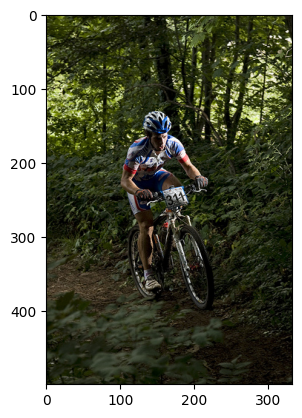

In [ ]:
generate_caption("3721082512_8277087f3f.jpg") #ok

---------------------Actual---------------------
startseq a dog is walking in a tire track in the snow endseq
startseq a golden dog is running along a tire track that ha been carved out in the snow endseq
startseq a young dog walking through the snow in a tire track endseq
startseq golden retriever puppy walking through snow endseq
startseq the dog is walking in the snow endseq
---------------------Predicted (Greedy)---------------------
startseq a dog is running through the snow endseq
---------------------Predicted (Beam Search)---------------------
startseq a dog is running through the snow endseq


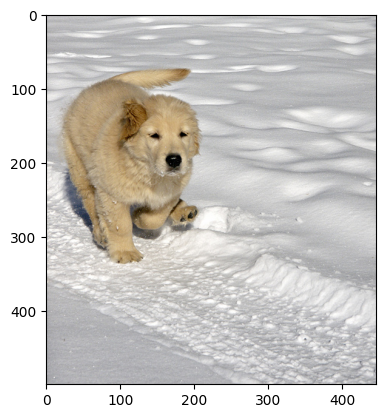

In [ ]:
generate_caption("3202360797_2084743e90.jpg") #ok

---------------------Actual---------------------
startseq a man jump high on his yellow skateboard over the concrete tile endseq
startseq a skateboarder get airtime endseq
startseq a skateboarder jumping with his skateboard endseq
startseq boy jumping in the air with a skateboard endseq
startseq skateboarder in black with yellow skateboard in midair endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a red shirt is skateboarding on a skateboard endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a red shirt is performing a trick on a skateboard endseq


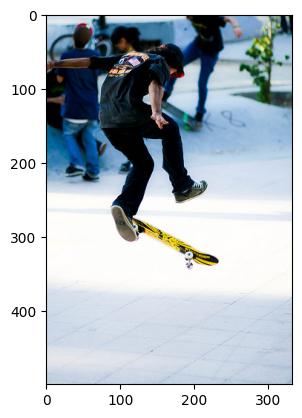

In [ ]:
generate_caption("3212465975_b657f40eed.jpg") #colore

---------------------Actual---------------------
startseq a black dog and a brown dog are jumping up to catch a red toy endseq
startseq a black dog and a brown dog play with a red toy on a courtyard endseq
startseq a brown and black lab are outside and the black lab is catching a toy in it mouth endseq
startseq black dog snap at red and black object a brown dog lunge endseq
startseq the chocolate lab jump too late to get the toy a the black lab capture it in the driveway endseq
---------------------Predicted (Greedy)---------------------
startseq a black dog is running in the grass endseq
---------------------Predicted (Beam Search)---------------------
startseq two dog are playing in the grass endseq


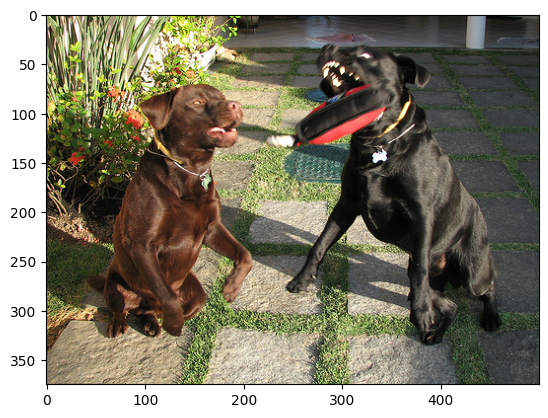

In [ ]:
generate_caption("1030985833_b0902ea560.jpg") #beam

---------------------Actual---------------------
startseq a girl in white is rock climbing endseq
startseq a woman in a white shirt and black cropped pant climb a rock wall endseq
startseq a young girl climbing a rock wall endseq
startseq fit brunette enjoys some time rock climbing endseq
startseq the girl is climbing an artificial climbing wall endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a white shirt is climbing a rock wall endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a white shirt climb a rock wall endseq


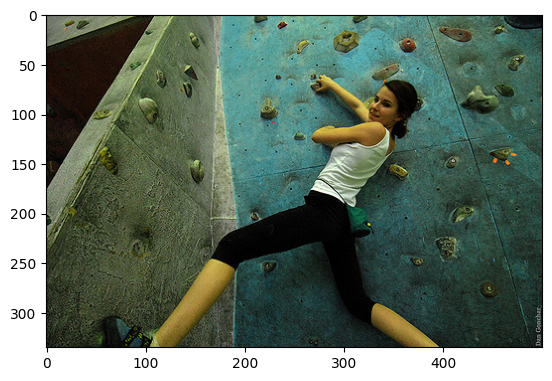

In [ ]:
generate_caption("3105623068_392b767a7b.jpg") #ok

---------------------Actual---------------------
startseq a blond child is jumping facefirst onto a bed endseq
startseq a little boy jump onto a bed endseq
startseq boy in black shirt jump onto bed from dresser endseq
startseq boy is bouncing over the bed wearing a black tshirt endseq
startseq little blonde boy is falling onto a bed endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a white shirt is jumping on a trampoline endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a white shirt is jumping in the air endseq


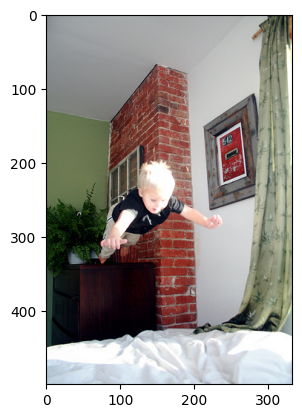

In [ ]:
generate_caption("3106791484_13e18c33d8.jpg") #colore

---------------------Actual---------------------
startseq the two dog are running toward the camera endseq
startseq two dog running along dirt path endseq
startseq two dog running down a path in the wood endseq
startseq two dog run through a field endseq
startseq two long haired dog racing down a forest path endseq
---------------------Predicted (Greedy)---------------------
startseq a dog is running through the grass endseq
---------------------Predicted (Beam Search)---------------------
startseq two dog are running through the grass endseq


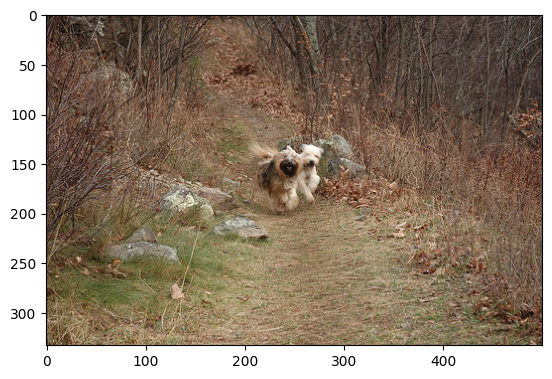

In [ ]:
generate_caption("315021440_122d56ebd7.jpg") #beam

---------------------Actual---------------------
startseq a woman in formal riding gear riding her horse on the beach endseq
startseq a woman is riding a brown horse on the shore of the ocean endseq
startseq a woman on horseback riding on the beach endseq
startseq a woman riding a large brown horse on the beach endseq
startseq person on a horse on the beach endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a cowboy hat and a cowboy cowboy jumping on a trampoline endseq
---------------------Predicted (Beam Search)---------------------
startseq a man wearing a cowboy hat is riding a horse on a dirt track endseq


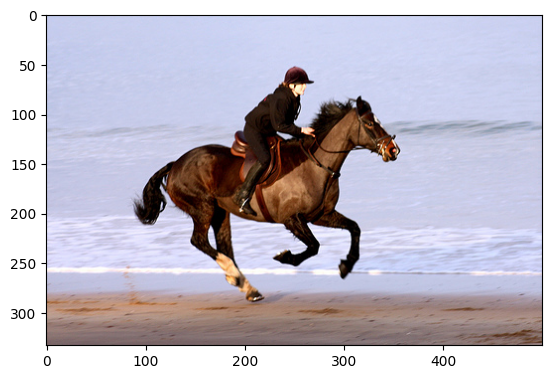

In [ ]:
generate_caption("3272002857_ace031f564.jpg") # trova di meglio

---------------------Actual---------------------
startseq a black and brown dog jumping over two white and purple stiped pole endseq
startseq a dog jump over a hurdle in the grass endseq
startseq a dog jump over an obstacle endseq
startseq black and brown dog jumping over hurdle with white support endseq
startseq dog performing during an outdoor dog show endseq
---------------------Predicted (Greedy)---------------------
startseq a black dog is running through the grass endseq
---------------------Predicted (Beam Search)---------------------
startseq a black dog jump over a hurdle endseq


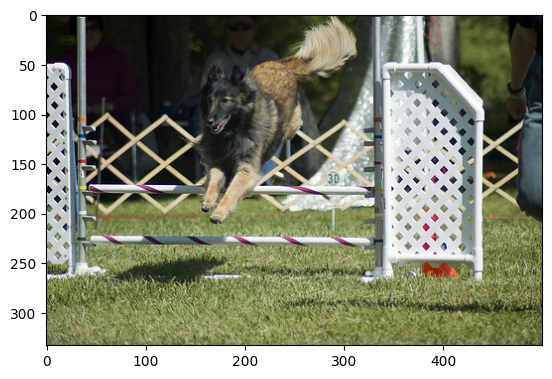

In [ ]:
generate_caption("3514019869_7de4ece2a5.jpg") #beam

---------------------Actual---------------------
startseq a boy and girl hold hand walking down a railroad track endseq
startseq a boy and girl hold hand a they walk on railroad track endseq
startseq a boy in a striped shirt and a little girl in a blue dress walk hand in hand down the train track endseq
startseq little girl and older male holding hand and walking on train track endseq
startseq the little girl in the blue dress is walking with a man along a railway track endseq
---------------------Predicted (Greedy)---------------------
startseq a woman in a blue shirt is riding a skateboard on a sidewalk endseq
---------------------Predicted (Beam Search)---------------------
startseq two people are walking down a track endseq


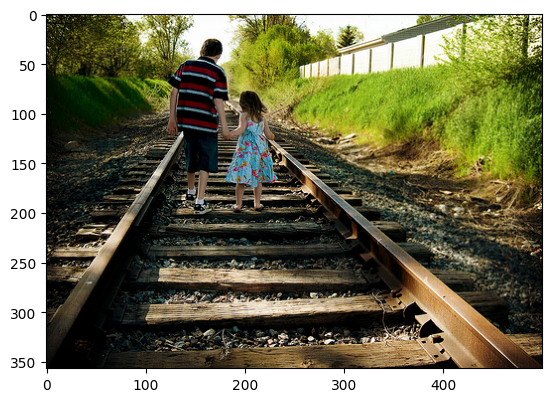

In [ ]:
generate_caption("3514188115_f51932ae5d.jpg") #beam

####Test Images

---------------------Actual---------------------
startseq a black dog jumping into a lake endseq
startseq a black dog with a red collar is jumping in the water endseq
startseq a black dog with a red collar is jumping out of the water endseq
startseq black dog with red collar splashing in water endseq
startseq the black dog with a red collar is jumping through the water endseq
---------------------Predicted (Greedy)---------------------
startseq a black dog is running through the water endseq
---------------------Predicted (Beam Search)---------------------
startseq a black dog is running through the water endseq


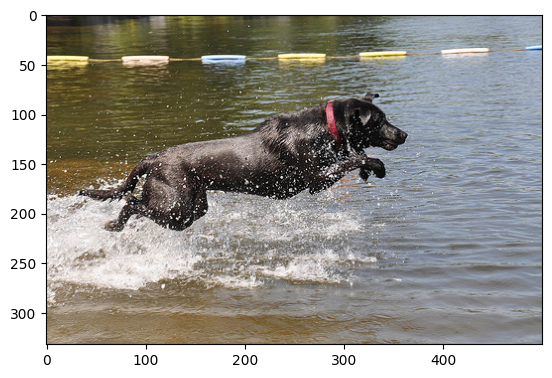

In [ ]:
generate_caption("3710520638_866d542a80.jpg") #ok

---------------------Actual---------------------
startseq a man in green and black get muddy on a dirt bike endseq
startseq a motocross racer in green and a helmet racing in the dirt endseq
startseq a person in a black and green outfit is riding a bicycle endseq
startseq man in green uniform riding dirt bike endseq
startseq this man is wearing green and black equipment to ride his dirt bike endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a helmet is riding a bike on a dirt road endseq
---------------------Predicted (Beam Search)---------------------
startseq a man is riding a bike on a dirt bike endseq endseq endseq


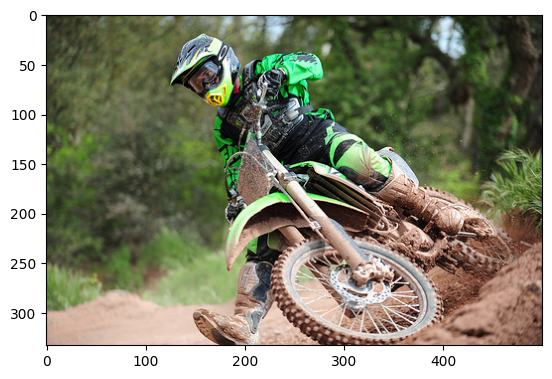

In [ ]:
generate_caption("3456862740_7550bcddc2.jpg") #greedy

---------------------Actual---------------------
startseq a person holding a tennis racket hit a yellow tennis ball endseq
startseq a tennis player hitting the ball endseq
startseq a tennis player hitting the ball endseq
startseq the tennis ball is about to be hit endseq
startseq this man is hitting a tennis ball with a tennis racket endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a white shirt hit a tennis ball endseq
---------------------Predicted (Beam Search)---------------------
startseq a man hit a tennis ball endseq


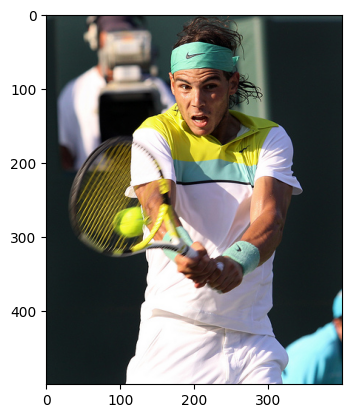

In [ ]:
generate_caption("3425887426_bf60b8afa3.jpg") #ok

---------------------Actual---------------------
startseq a boy jump into the water upside down endseq
startseq a child diving headfirst into a lake endseq
startseq a man is falling backward in swim gear over a large body of water nearby an urban area endseq
startseq the man is going into the water endseq
startseq the person is going into the water endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a white shirt is jumping into the water endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a white shirt is jumping into the water endseq


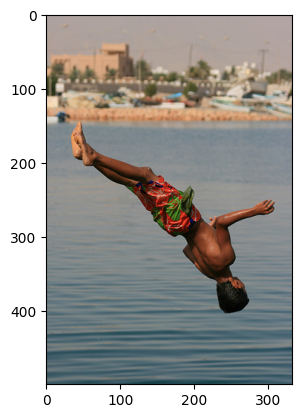

In [ ]:
generate_caption("3667492609_97f88b373f.jpg") #colore

---------------------Actual---------------------
startseq a bicyclist is drinking out of a bottle of water while riding endseq
startseq a biker take a drink of water endseq
startseq a cyclist drink water endseq
startseq a man riding a bicycle drink from a bottle of water endseq
startseq a person take a drink of water while riding on a bike endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a red helmet and helmet is riding a bike in a race endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a red helmet is riding a bike on a bike endseq


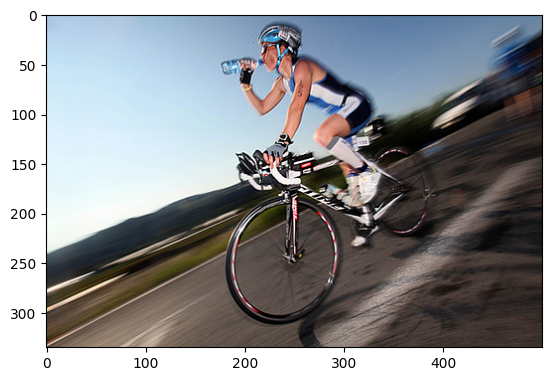

In [ ]:
generate_caption("3671933270_d124e9a1a4.jpg") #NO

---------------------Actual---------------------
startseq a man in a crowd wear a red hat and a red bandanna over his face endseq
startseq a person with dreadlock and a red hat with their face covered by a red bandanna endseq
startseq a woman wearing a hat and red scarf stand among others wearing similar clothes endseq
startseq a woman wearing a red hat and red bandanna followed by a man in a red bandanna endseq
startseq the lady is wearing a bandanna around her face to protect her from dust endseq
---------------------Predicted (Greedy)---------------------
startseq a woman in a red hat and red hat is wearing a red hat and red hat endseq
---------------------Predicted (Beam Search)---------------------
startseq a woman wearing a red hat and red hat is wearing a red hat and red hat endseq


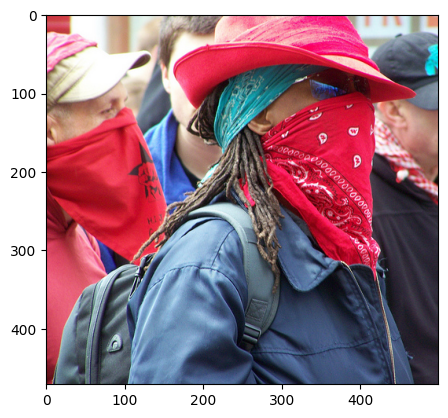

In [ ]:
generate_caption("3503623999_bbd5dcfb18.jpg") #NO

---------------------Actual---------------------
startseq a boy in a grey hat is carrying a soccer ball by a reddish colored wall endseq
startseq a child dressed in a blue shirt and cap is carrying a soccer ball endseq
startseq a little boy is holding a soccer ball endseq
startseq a small boy is carrying a soccer ball endseq
startseq a small child wearing a hat and coat holding a large ball endseq
---------------------Predicted (Greedy)---------------------
startseq a boy in a blue shirt and blue shirt is playing with a soccer ball endseq
---------------------Predicted (Beam Search)---------------------
startseq a young boy in a blue shirt is playing with a soccer ball endseq


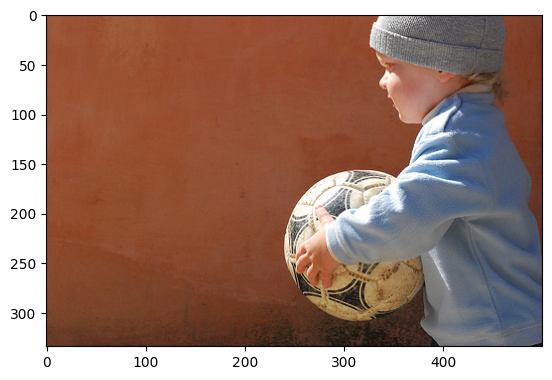

In [ ]:
generate_caption("3475552729_a3abd81ee6.jpg") #beam

---------------------Actual---------------------
startseq a guy in a yellow shirt with a bike get very high in the air endseq
startseq a man in midair holding his bike s handlebar endseq
startseq a man is performing a trick high in the air with a bicycle endseq
startseq a man wearing a yellow shirt is doing a trick high in the air with his bike endseq
startseq man holding onto bike handlebar while in midair endseq
---------------------Predicted (Greedy)---------------------
startseq a man is performing a trick on a bike endseq
---------------------Predicted (Beam Search)---------------------
startseq a man is performing a trick on a bike endseq endseq


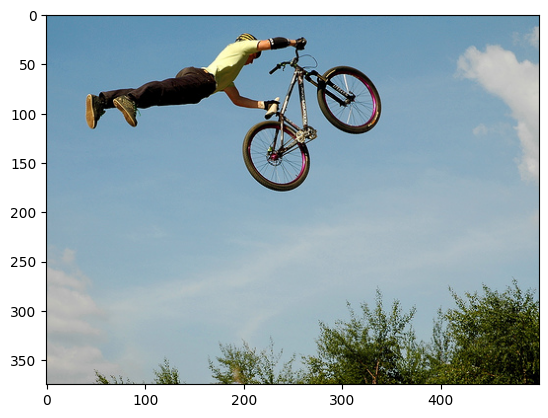

In [ ]:
generate_caption("2520909293_9bb7f7364e.jpg") #ok

---------------------Actual---------------------
startseq two guitarist dressed in white perform endseq
startseq two guitar player dressed in white endseq
startseq two men in white suit play the guitar on a stage endseq
startseq two men wearing all white kneel on the floor palying guitar endseq
startseq two men wearing white suit play guitar onstage endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a white suit play guitar endseq
---------------------Predicted (Beam Search)---------------------
startseq a man in a white suit is playing guitar endseq


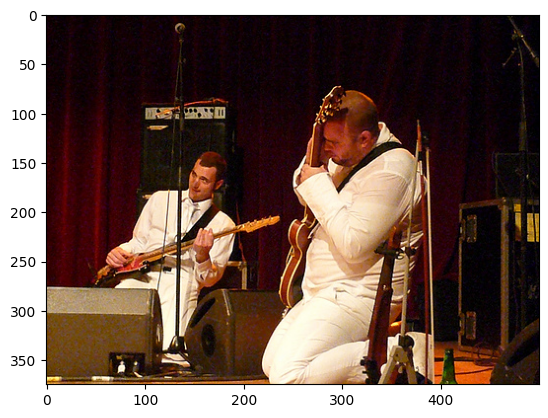

In [ ]:
generate_caption("3326588088_172d1b2584.jpg") #ok?

---------------------Actual---------------------
startseq a man ski on a snowy mountain endseq
startseq a person ski down a steep snowy hill endseq
startseq a skier skiing down a snowy mountainside endseq
startseq a skier speed through the snow endseq
startseq the skier is descending the hill whilst wearing a silver helmet and red backpack endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a red jacket is skiing down a snowy hill endseq
---------------------Predicted (Beam Search)---------------------
startseq a person skiing down a snowy hill endseq


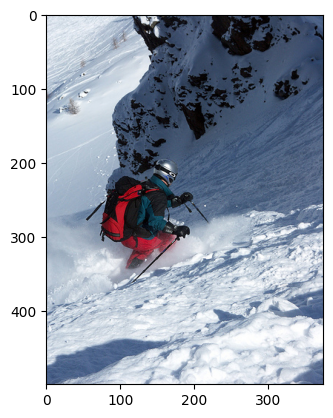

In [ ]:
generate_caption("511844627_0ec78e01e9.jpg") #greedy

---------------------Actual---------------------
startseq a black dog playing with a purple toy in the snow endseq
startseq a black dog run through the snow carrying a blue toy endseq
startseq a dog play in the snow endseq
startseq dog running with a purple toy in the snowy field endseq
startseq the black and brown dog carry a purple toy in the snow endseq
---------------------Predicted (Greedy)---------------------
startseq a black dog is running through the snow endseq
---------------------Predicted (Beam Search)---------------------
startseq a black dog is running through the snow endseq


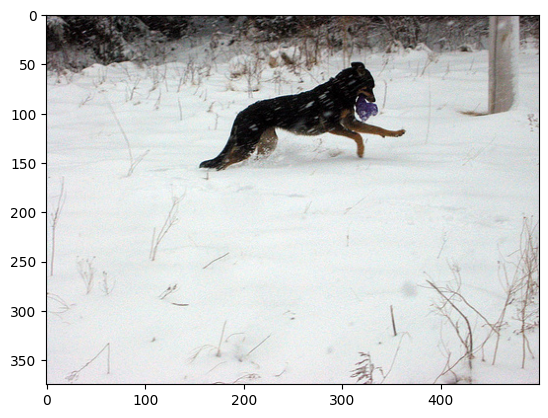

In [ ]:
generate_caption("447800028_0242008fa3.jpg") #ok

---------------------Actual---------------------
startseq a man in red climb a rock in a field of snow cliff and fallen boulder endseq
startseq a man is rock climbing up a snowy rocky mountain endseq
startseq a man wearing a red shirt scale a rock in a boulder field endseq
startseq a person climbing a large rock with many snow covered rock in the background endseq
startseq the person with the red long sleeved shirt is climbing a rock in the snow endseq
---------------------Predicted (Greedy)---------------------
startseq a man in a red jacket is climbing a steep steep steep snowy mountain endseq
---------------------Predicted (Beam Search)---------------------
startseq a group of people sit on a snowy mountain endseq


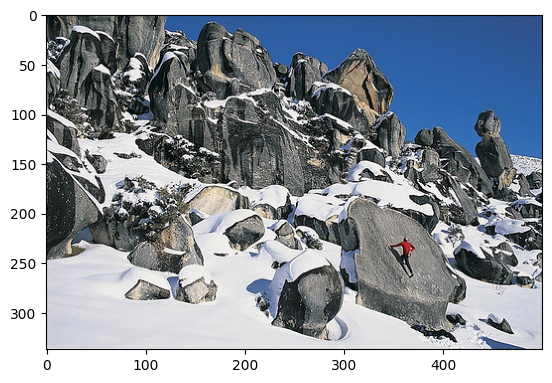

In [ ]:
generate_caption("478209058_21e2c37c73.jpg") # CAMBIA